# Foundations of Data Mining: Assignment 2

Please complete all assignments in this notebook. You should submit this notebook, as well as a PDF version (See File > Download as).

In [1]:
%matplotlib inline
from preamble import *
plt.rcParams['savefig.dpi'] = 100 # This controls the size of your figures
# Comment out and restart notebook if you only want the last output of each cell.
InteractiveShell.ast_node_interactivity = "all"

from sklearn import ensemble
from openml import tasks, runs
import xmltodict
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import (GridSearchCV, RandomizedSearchCV,
                                     ShuffleSplit, StratifiedKFold,
                                     cross_val_score, train_test_split)
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.feature_selection import SelectKBest, chi2, SelectFromModel
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import RobustScaler, PolynomialFeatures
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import RidgeClassifier, LogisticRegression
from sklearn.utils import shuffle
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from IPython.display import clear_output
from sklearn import ensemble
from openml import tasks, runs
import xmltodict
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.svm import SVC, LinearSVC
from sklearn.model_selection import (GridSearchCV, RandomizedSearchCV,
                                     ShuffleSplit, StratifiedKFold,
                                     cross_val_score, train_test_split)
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.feature_selection import SelectKBest, chi2, SelectFromModel
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import RobustScaler, PolynomialFeatures
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import RidgeClassifier, LogisticRegression
from sklearn.utils import shuffle
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

## Kernel selection (4 points (1+2+1))
SVMs can be trained with different kernels. Generate a 2-dimensional dataset as shown below and study the effect of the choice of kernel by visualizing the results.

- Train a SVM classifier on the dataset using respectively a linear, polynomial and radial basis function (RBF) kernel, evaluate the performance of each kernel using 10-fold cross-validation and AUC. Which one works best? Visualize the results. Can you intuitively explain why one kernel is more suited than another?
    - Hint: you can use the visualization code used in class. It is under mglearn/plot_svm.py > plot_svm_kernels().
- Take the RBF kernel and vary both the C parameter and the kernel width ($\gamma$). Use 3 values for each (a very small, default, and very large value). For each of the 9 combinations, create the same RBF plot as before, report the number of support vectors, and the AUC performance. Explain the performance results. When are you over/underfitting?
    - Hint: values for C and $\gamma$ are typically in [$2^{-15}..2^{15}$] on a log scale. 
    - Hint: don't count the support vectors manually, retrieve them from the trained SVM.
- Vary C and $\gamma$ again, but this time use a grid of at least 20x20, vary both parameters uniformly on a log scale, and visualise the results using a $C \times \gamma \rightarrow AUC$ heatmap. Explain the performance results, and compare them to the 9 results obtained in the previous subquestion. Can you also tell in which regions of the heatmap you are over/underfitting?
    - Hint: We've constructed such a heatmap in class and in assignment 1.

In [90]:
from sklearn.datasets import make_blobs
X, y = make_blobs(centers=2, n_samples=1000, random_state=0)


def plot_svm(clf, support_vectors=True, colors=True, contours=True, plot_perc=1.0):
    if support_vectors:
        plt.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1],
                    s=85, edgecolors='k', c='w', zorder=10, marker='.');
    
    if plot_perc > 0.0:
        if plot_perc < 1.0:
            num = int(plot_perc * X.shape[0])
            indexes = np.array(np.floor(np.random.sample(X.shape[0]) * num),
                               dtype=np.int)
            xs, ys, cs = X[indexes, 0], X[indexes, 1], y[indexes]
        else:
            xs, ys, cs = X[:,0], X[:,1], y

        plt.scatter(xs, ys, c=cs, zorder=10, cmap=plt.cm.bwr, marker='.');
    
    plt.axis('tight');
    x_min = -2
    y_min = -3
    x_max = 6
    y_max = 9

    XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j]
    Z = clf.decision_function(np.c_[XX.ravel(), YY.ravel()]);

    Z = Z.reshape(XX.shape);
    if colors:
        plt.pcolormesh(XX, YY, Z > 0, cmap=plt.cm.bwr, alpha=0.1);
    
    if contours:
        plt.contour(XX, YY, Z, colors=['k', 'k', 'k'], linestyles=['--', '-', '--'],
                    levels=[-.5, 0, .5]);

    plt.xlim(x_min, x_max); plt.ylim(y_min, y_max);
    plt.xticks([]); plt.yticks([]); 

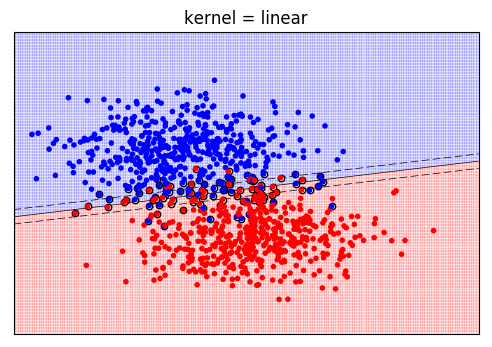

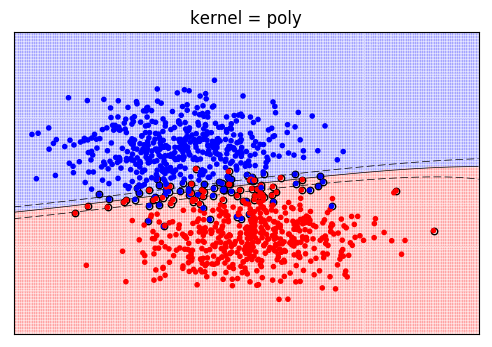

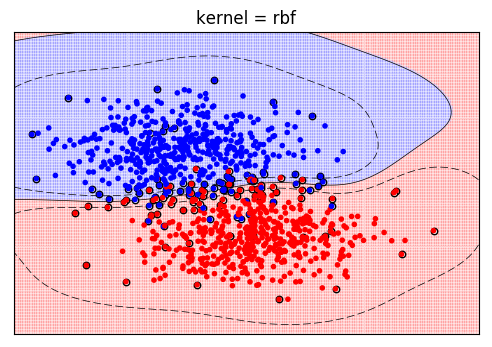

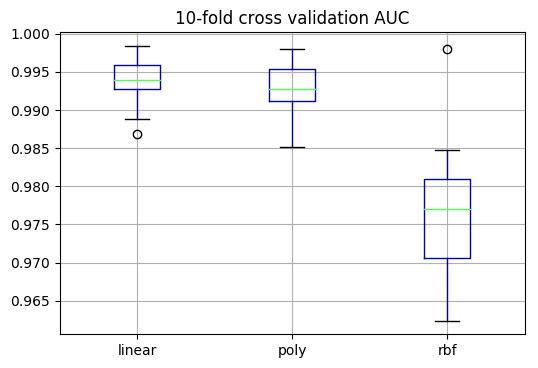

In [64]:
from sklearn.svm import SVC
from sklearn.model_selection import (GridSearchCV, RandomizedSearchCV,
                                     ShuffleSplit, StratifiedKFold,
                                     cross_val_score, train_test_split)


scores = {}
for i, kernel in enumerate(['linear', 'poly', 'rbf']):
    clf = SVC(kernel=kernel);
    scores[kernel] = cross_val_score(clf, X, y, cv=10, scoring='roc_auc');
    clf.fit(X, y);

    plt.figure();
    plt.title('kernel = %s' % kernel);
    plot_svm(clf)


plt.figure();
df = pd.DataFrame(list(scores.values()), index=list(scores.keys()));
df.T.boxplot(list(scores.keys()));
plt.title('10-fold cross validation AUC')
plt.show();

The linear and polynomial kernels work best in this scenario, and they produce very similar classification boundaries. It seems like the optimal separation boundary between the two blobs is actually linear, which can be modeled well by those two kernels, while the RBF kernel seems to produce a wawe-like separation boundary. This boundary has some variability which depends on the actual points used to build it, explaining why the RBF kernel has slightly lower scores; in other words, it tends to overfit the data.

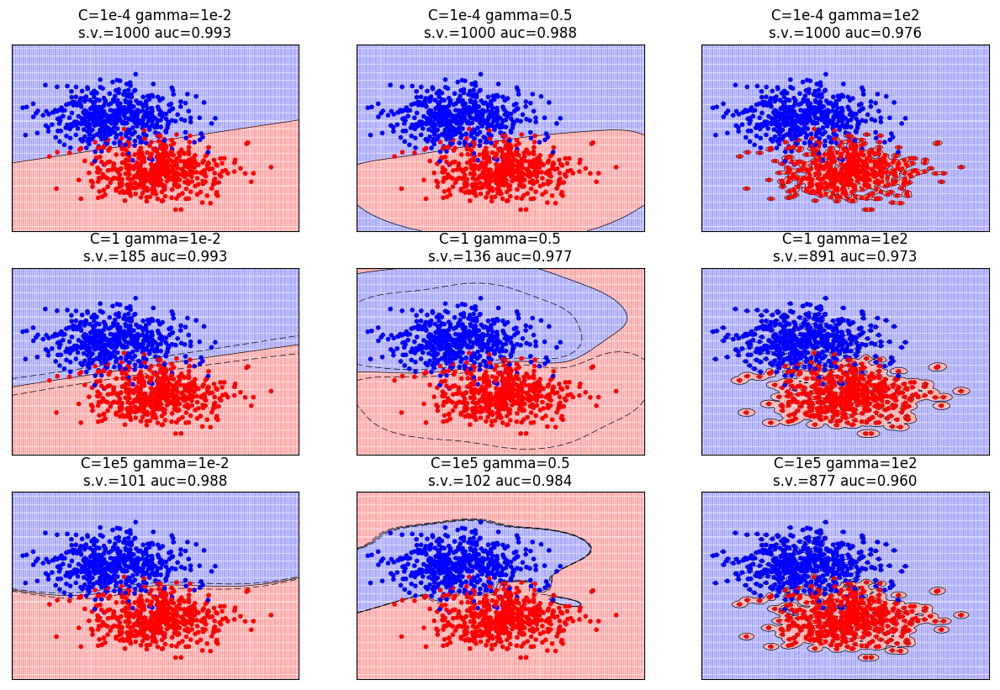

In [99]:
import mglearn

plt.figure(figsize=(15, 10));
fig_num = 0
for c in ['1e-4', '1', '1e5']:
    for gamma in ['1e-2', '0.5', '1e2']:
        svm = SVC(kernel='rbf', C=float(c), gamma=float(gamma))
        auc = cross_val_score(svm, X, y, cv=10, scoring='roc_auc')
        svm.fit(X, y)
        
        fig_num += 1
        plt.subplot(3, 3, fig_num);
        plt.title('C=%s gamma=%s\ns.v.=%d auc=%.3f' % (
            c, gamma, svm.support_vectors_.shape[0], auc.mean()
        ));
        plot_svm(svm, support_vectors=False);
        
plt.show();

From these plots, it seems like high gamma values lead to overfitting, while low gamma values tend to models resemble a linear model; note that the plot with C=1 and gamma=1e-2 is almost identical to the one produced with the linear kernel in the previous section.

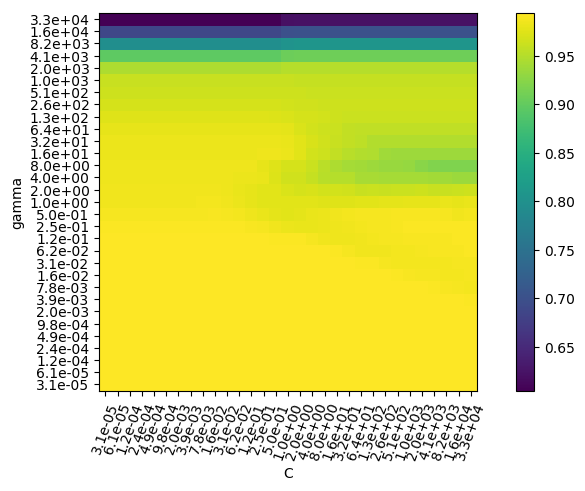

In [101]:
DEBUG = False
if DEBUG:
    print('*** DEBUG RUN ***')
    vals = [2**x for x in range(-1, 2)]
else:
    vals = [2**x for x in range(-15, 16)]
    
param_grid = {
    'C': vals,
    'gamma': vals,
}

gs = GridSearchCV(SVC(kernel='rbf'), param_grid=param_grid,
                  cv=10, n_jobs=-1, scoring='roc_auc');
gs.fit(X, y);


scores = np.array(gs.cv_results_['mean_test_score']).reshape(
    len(param_grid['C']),
    len(param_grid['gamma'])
).T;

plt.figure(figsize=(10, 5))
img = mglearn.tools.heatmap(
    scores, cmap='viridis', fmt='',
    ylabel='gamma', yticklabels=param_grid['gamma'],
    xlabel='C', xticklabels=param_grid['C'],
);
plt.setp(img.get_axes().xaxis.get_majorticklabels(),
         rotation=70);
plt.xticks(plt.xticks()[0], ['%.1e' % x for x in vals]);
plt.yticks(plt.yticks()[0], ['%.1e' % x for x in vals]);
plt.colorbar(img);

## Robots and SVMs (4 points (2+1+1))

The [Wall Robot Navigation dataset](http://www.openml.org/d/1497) contains about 5500 readings of an ultrasound sensor array mounted on a robot, and your task is to finetune and train an SVM classifier to predict how the robot should move next.

- Make a stratified 80-20 split of the data. On the training set alone, optimize the main hyperparameters of the SVM for AUC with a random search. Vary at least the main kernel types (linear, polynomial, and RBF), the C parameter, the $\gamma$ parameter for the RBF kernel and the exponent/degree for the polynomial kernel. Report the optimal hyperparameter settings and AUC performance. 
    - The degree of the polynonial is typically in the range 2..10.
    - Hint: note that the hyperparameter ranges depend on each other. For instance, $\gamma$ only makes sense if you have selected the RBF kernel as well. We've seen in class how to define multiple hyperparameter spaces in a random/grid search.
- Use a 5x3-fold (5 outer, 3 inner) nested cross-validation (CV) on the training set to obtain a clean evaluation. Evaluate your optimized hyperparameter settings on the separate test set and discuss the result. Is the performance on the independent test set comparable with the result of the random search?
    - Hint: for the nested resampling, use at least a 10-fold CV for the outer loop. The inner loop can be a 3-fold CV or a simple holdout.
- Train an SVM using the optimal hyperparameter configuration you found and test it on the held out (20%) test set. Compare this AUC result with the (mean) result of the nested CV. If you would build this robot in practice, how would you find the hyperparameters to use, and which performance would you expect? Is it truly necessary to tune the hyperparameters? Which hyperparameters were most important to tune?

In [2]:
robot_data = oml.datasets.get_dataset(1497)
X, y = robot_data.get_data(target=robot_data.default_target_attribute);
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.2);

In [7]:
iters = 2 if DEBUG else 50

vals = [2**x for x in range(-16, 17)]
rs = RandomizedSearchCV(SVC(), cv=10, n_jobs=-1, n_iter=iters,
                        scoring='accuracy', param_distributions={
    'kernel': ['linear', 'rbf', 'poly'],
    'C': vals, 'gamma': vals,
    'degree': range(2, 11),
});
_ = rs.fit(Xtrain, ytrain);

print('Best AUC: {:.3f} with params: {}'.format(rs.best_score_, rs.best_params_))

RandomizedSearchCV(cv=10, error_score='raise',
          estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape=None, degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False),
          fit_params={}, iid=True, n_iter=10, n_jobs=-1,
          param_distributions={'kernel': ['linear', 'rbf', 'poly'], 'C': [1.52587890625e-05, 3.0517578125e-05, 6.103515625e-05, 0.0001220703125, 0.000244140625, 0.00048828125, 0.0009765625, 0.001953125, 0.00390625, 0.0078125, 0.015625, 0.03125, 0.0625, 0.125, 0.25, 0.5, 1, 2, 4, 8, 16, 32, 64, 128, 256, 512, ... 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32768, 65536], 'degree': range(2, 11)},
          pre_dispatch='2*n_jobs', random_state=None, refit=True,
          return_train_score=True, scoring='accuracy', verbose=0)

Best AUC: 0.8900091659028414 with params: {'kernel': 'poly', 'gamma': 0.03125, 'degree': 6, 'C': 32768}


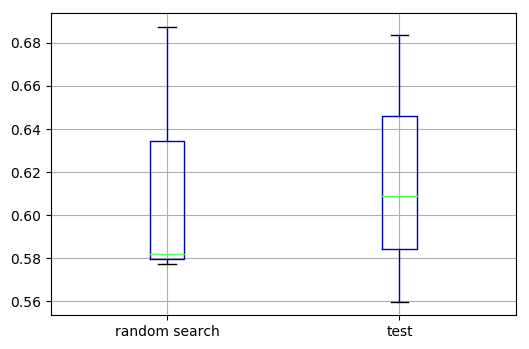

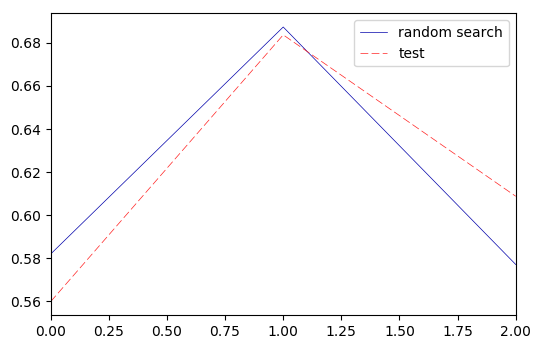

In [6]:
DEBUG = False
iters = 2 if DEBUG else 10
cv = 3 if DEBUG else 10

scores = []
best_score = best_params = None
for train_index, test_index in StratifiedKFold(cv).split(Xtrain, ytrain):
    vals = [2**x for x in range(-16, 17)]
    rs = RandomizedSearchCV(SVC(), cv=3, n_jobs=-1, n_iter=iters, verbose=4,
                            scoring='accuracy', param_distributions={
        'kernel': ['linear', 'rbf', 'poly'],
        'C': vals, 'gamma': vals,
        'degree': range(2, 11),
    });
    _ = rs.fit(X[train_index], y[train_index]);
    
    test_pred = rs.best_estimator_.predict(X[test_index])
    test_acc = accuracy_score(y[test_index], test_pred)
    
    if not best_score or test_acc > best_score:
        best_score, best_params = test_acc, rs.best_params_
    
    scores.append((rs.best_score_, test_acc))
    print('Best random search score: {:.3f}, test score: {:.3f}'.format(
        *scores[-1]
    ))

clear_output()
df = pd.DataFrame(scores, columns=['random search', 'test']);
print('Mean test accuracy: {:.3f}'.format(df['test'].mean()))
df.boxplot();
df.plot();

In [8]:
clf = SVC(**best_params);
clf.fit(Xtrain, ytrain);
ypred = clf.predict(Xtest)
print('Accuracy on the held out test set: {:.3f}'.format(
    accuracy_score(ytest, ypred)
))

SVC(C=0.5, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape=None, degree=4, gamma=0.00390625,
  kernel='linear', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)

Accuracy on the held out test set: 0.728


## A benchmark study (3 points (2+1))

A benchmark study is an experiment in which multiple algorithms are evaluated on multiple datasets. The end goal is to study whether one algorithm is generally better than the others. Meaningful benchmark studies can grow quite complex, here we do a simplified variant.

* Download OpenML datasets 37, 42, 188, 470, and 1464. They are sufficiently large (e.g., at least 500 data points) so that the performance estimation is trustworthy. Select at least three classifiers that we discussed in class, e.g. kNN, Logistic Regression, Random Forests, Gradient Boosting, SVMs, Naive Bayes. Note that some of these algorithms take longer to train. Evaluate all classifiers (with default parameter settings) on all datasets, using a 10-fold CV and AUC. Show the results in a table and interpret them. Which is the best algorithm in this benchmark?
    * Note that these datasets have categorical features, different scales, missing values, and (likely) irrelevant features. You'll need to build pipelines to correctly build all models.
    * Hint: You can either compare the performances directly, or (better) use a statistical significance test, e.g. a pairwise t-test or (better) Wilcoxon signed ranks test, to see whether the performance differences are significant. This is covered in statistics courses. You can then count wins, ties and losses.
* Repeat the benchmark, but now additionally optimize the main hyperparameters of each algorithm in a grid or random search (don't overdo it). Does this affect the ranking of the algorithms?

[None, None, None, None, None, None, None, None, None, None]

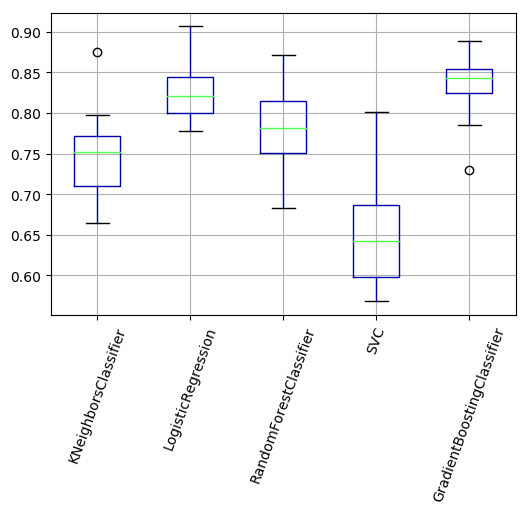

C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:581: Warning: The least populated class in y has only 8 members, which is too few. The minimum number of groups for any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)


JoblibValueError: JoblibValueError
___________________________________________________________________________
Multiprocessing exception:
...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\runpy.py in _run_module_as_main(mod_name='ipykernel.__main__', alter_argv=1)
    188         sys.exit(msg)
    189     main_globals = sys.modules["__main__"].__dict__
    190     if alter_argv:
    191         sys.argv[0] = mod_spec.origin
    192     return _run_code(code, main_globals, None,
--> 193                      "__main__", mod_spec)
        mod_spec = ModuleSpec(name='ipykernel.__main__', loader=<_f...da3\\lib\\site-packages\\ipykernel\\__main__.py')
    194 
    195 def run_module(mod_name, init_globals=None,
    196                run_name=None, alter_sys=False):
    197     """Execute a module's code without importing it

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\runpy.py in _run_code(code=<code object <module> at 0x0000017C9A2ADAE0, fil...lib\site-packages\ipykernel\__main__.py", line 1>, run_globals={'__annotations__': {}, '__builtins__': <module 'builtins' (built-in)>, '__cached__': r'C:\Users\s166979\AppData\Local\Continuum\Anacond...ges\ipykernel\__pycache__\__main__.cpython-36.pyc', '__doc__': None, '__file__': r'C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel\__main__.py', '__loader__': <_frozen_importlib_external.SourceFileLoader object>, '__name__': '__main__', '__package__': 'ipykernel', '__spec__': ModuleSpec(name='ipykernel.__main__', loader=<_f...da3\\lib\\site-packages\\ipykernel\\__main__.py'), 'app': <module 'ipykernel.kernelapp' from 'C:\\Users\\s...a3\\lib\\site-packages\\ipykernel\\kernelapp.py'>}, init_globals=None, mod_name='__main__', mod_spec=ModuleSpec(name='ipykernel.__main__', loader=<_f...da3\\lib\\site-packages\\ipykernel\\__main__.py'), pkg_name='ipykernel', script_name=None)
     80                        __cached__ = cached,
     81                        __doc__ = None,
     82                        __loader__ = loader,
     83                        __package__ = pkg_name,
     84                        __spec__ = mod_spec)
---> 85     exec(code, run_globals)
        code = <code object <module> at 0x0000017C9A2ADAE0, fil...lib\site-packages\ipykernel\__main__.py", line 1>
        run_globals = {'__annotations__': {}, '__builtins__': <module 'builtins' (built-in)>, '__cached__': r'C:\Users\s166979\AppData\Local\Continuum\Anacond...ges\ipykernel\__pycache__\__main__.cpython-36.pyc', '__doc__': None, '__file__': r'C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel\__main__.py', '__loader__': <_frozen_importlib_external.SourceFileLoader object>, '__name__': '__main__', '__package__': 'ipykernel', '__spec__': ModuleSpec(name='ipykernel.__main__', loader=<_f...da3\\lib\\site-packages\\ipykernel\\__main__.py'), 'app': <module 'ipykernel.kernelapp' from 'C:\\Users\\s...a3\\lib\\site-packages\\ipykernel\\kernelapp.py'>}
     86     return run_globals
     87 
     88 def _run_module_code(code, init_globals=None,
     89                     mod_name=None, mod_spec=None,

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel\__main__.py in <module>()
      1 
      2 
----> 3 
      4 if __name__ == '__main__':
      5     from ipykernel import kernelapp as app
      6     app.launch_new_instance()
      7 
      8 
      9 
     10 

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\traitlets\config\application.py in launch_instance(cls=<class 'ipykernel.kernelapp.IPKernelApp'>, argv=None, **kwargs={})
    653 
    654         If a global instance already exists, this reinitializes and starts it
    655         """
    656         app = cls.instance(**kwargs)
    657         app.initialize(argv)
--> 658         app.start()
        app.start = <bound method IPKernelApp.start of <ipykernel.kernelapp.IPKernelApp object>>
    659 
    660 #-----------------------------------------------------------------------------
    661 # utility functions, for convenience
    662 #-----------------------------------------------------------------------------

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel\kernelapp.py in start(self=<ipykernel.kernelapp.IPKernelApp object>)
    469             return self.subapp.start()
    470         if self.poller is not None:
    471             self.poller.start()
    472         self.kernel.start()
    473         try:
--> 474             ioloop.IOLoop.instance().start()
    475         except KeyboardInterrupt:
    476             pass
    477 
    478 launch_new_instance = IPKernelApp.launch_instance

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\zmq\eventloop\ioloop.py in start(self=<zmq.eventloop.ioloop.ZMQIOLoop object>)
    172             )
    173         return loop
    174     
    175     def start(self):
    176         try:
--> 177             super(ZMQIOLoop, self).start()
        self.start = <bound method ZMQIOLoop.start of <zmq.eventloop.ioloop.ZMQIOLoop object>>
    178         except ZMQError as e:
    179             if e.errno == ETERM:
    180                 # quietly return on ETERM
    181                 pass

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\tornado\ioloop.py in start(self=<zmq.eventloop.ioloop.ZMQIOLoop object>)
    882                 self._events.update(event_pairs)
    883                 while self._events:
    884                     fd, events = self._events.popitem()
    885                     try:
    886                         fd_obj, handler_func = self._handlers[fd]
--> 887                         handler_func(fd_obj, events)
        handler_func = <function wrap.<locals>.null_wrapper>
        fd_obj = <zmq.sugar.socket.Socket object>
        events = 1
    888                     except (OSError, IOError) as e:
    889                         if errno_from_exception(e) == errno.EPIPE:
    890                             # Happens when the client closes the connection
    891                             pass

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\tornado\stack_context.py in null_wrapper(*args=(<zmq.sugar.socket.Socket object>, 1), **kwargs={})
    270         # Fast path when there are no active contexts.
    271         def null_wrapper(*args, **kwargs):
    272             try:
    273                 current_state = _state.contexts
    274                 _state.contexts = cap_contexts[0]
--> 275                 return fn(*args, **kwargs)
        args = (<zmq.sugar.socket.Socket object>, 1)
        kwargs = {}
    276             finally:
    277                 _state.contexts = current_state
    278         null_wrapper._wrapped = True
    279         return null_wrapper

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\zmq\eventloop\zmqstream.py in _handle_events(self=<zmq.eventloop.zmqstream.ZMQStream object>, fd=<zmq.sugar.socket.Socket object>, events=1)
    435             # dispatch events:
    436             if events & IOLoop.ERROR:
    437                 gen_log.error("got POLLERR event on ZMQStream, which doesn't make sense")
    438                 return
    439             if events & IOLoop.READ:
--> 440                 self._handle_recv()
        self._handle_recv = <bound method ZMQStream._handle_recv of <zmq.eventloop.zmqstream.ZMQStream object>>
    441                 if not self.socket:
    442                     return
    443             if events & IOLoop.WRITE:
    444                 self._handle_send()

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\zmq\eventloop\zmqstream.py in _handle_recv(self=<zmq.eventloop.zmqstream.ZMQStream object>)
    467                 gen_log.error("RECV Error: %s"%zmq.strerror(e.errno))
    468         else:
    469             if self._recv_callback:
    470                 callback = self._recv_callback
    471                 # self._recv_callback = None
--> 472                 self._run_callback(callback, msg)
        self._run_callback = <bound method ZMQStream._run_callback of <zmq.eventloop.zmqstream.ZMQStream object>>
        callback = <function wrap.<locals>.null_wrapper>
        msg = [<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>]
    473                 
    474         # self.update_state()
    475         
    476 

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\zmq\eventloop\zmqstream.py in _run_callback(self=<zmq.eventloop.zmqstream.ZMQStream object>, callback=<function wrap.<locals>.null_wrapper>, *args=([<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>],), **kwargs={})
    409         close our socket."""
    410         try:
    411             # Use a NullContext to ensure that all StackContexts are run
    412             # inside our blanket exception handler rather than outside.
    413             with stack_context.NullContext():
--> 414                 callback(*args, **kwargs)
        callback = <function wrap.<locals>.null_wrapper>
        args = ([<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>],)
        kwargs = {}
    415         except:
    416             gen_log.error("Uncaught exception, closing connection.",
    417                           exc_info=True)
    418             # Close the socket on an uncaught exception from a user callback

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\tornado\stack_context.py in null_wrapper(*args=([<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>],), **kwargs={})
    270         # Fast path when there are no active contexts.
    271         def null_wrapper(*args, **kwargs):
    272             try:
    273                 current_state = _state.contexts
    274                 _state.contexts = cap_contexts[0]
--> 275                 return fn(*args, **kwargs)
        args = ([<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>],)
        kwargs = {}
    276             finally:
    277                 _state.contexts = current_state
    278         null_wrapper._wrapped = True
    279         return null_wrapper

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel\kernelbase.py in dispatcher(msg=[<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>])
    271         if self.control_stream:
    272             self.control_stream.on_recv(self.dispatch_control, copy=False)
    273 
    274         def make_dispatcher(stream):
    275             def dispatcher(msg):
--> 276                 return self.dispatch_shell(stream, msg)
        msg = [<zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>, <zmq.sugar.frame.Frame object>]
    277             return dispatcher
    278 
    279         for s in self.shell_streams:
    280             s.on_recv(make_dispatcher(s), copy=False)

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel\kernelbase.py in dispatch_shell(self=<ipykernel.ipkernel.IPythonKernel object>, stream=<zmq.eventloop.zmqstream.ZMQStream object>, msg={'buffers': [], 'content': {'allow_stdin': True, 'code': 'def clean_dataset(dataset):\n    ds = oml.dataset...klabels(),\n         rotation=70);\n    plt.show();', 'silent': False, 'stop_on_error': True, 'store_history': True, 'user_expressions': {}}, 'header': {'date': '2017-02-26T22:18:54.030470', 'msg_id': '9C99DCB90B7049148D89773E0911D07A', 'msg_type': 'execute_request', 'session': '65AC3AA9D2984A8181B514316C77B36A', 'username': 'username', 'version': '5.0'}, 'metadata': {}, 'msg_id': '9C99DCB90B7049148D89773E0911D07A', 'msg_type': 'execute_request', 'parent_header': {}})
    223             self.log.error("UNKNOWN MESSAGE TYPE: %r", msg_type)
    224         else:
    225             self.log.debug("%s: %s", msg_type, msg)
    226             self.pre_handler_hook()
    227             try:
--> 228                 handler(stream, idents, msg)
        handler = <bound method Kernel.execute_request of <ipykernel.ipkernel.IPythonKernel object>>
        stream = <zmq.eventloop.zmqstream.ZMQStream object>
        idents = [b'65AC3AA9D2984A8181B514316C77B36A']
        msg = {'buffers': [], 'content': {'allow_stdin': True, 'code': 'def clean_dataset(dataset):\n    ds = oml.dataset...klabels(),\n         rotation=70);\n    plt.show();', 'silent': False, 'stop_on_error': True, 'store_history': True, 'user_expressions': {}}, 'header': {'date': '2017-02-26T22:18:54.030470', 'msg_id': '9C99DCB90B7049148D89773E0911D07A', 'msg_type': 'execute_request', 'session': '65AC3AA9D2984A8181B514316C77B36A', 'username': 'username', 'version': '5.0'}, 'metadata': {}, 'msg_id': '9C99DCB90B7049148D89773E0911D07A', 'msg_type': 'execute_request', 'parent_header': {}}
    229             except Exception:
    230                 self.log.error("Exception in message handler:", exc_info=True)
    231             finally:
    232                 self.post_handler_hook()

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel\kernelbase.py in execute_request(self=<ipykernel.ipkernel.IPythonKernel object>, stream=<zmq.eventloop.zmqstream.ZMQStream object>, ident=[b'65AC3AA9D2984A8181B514316C77B36A'], parent={'buffers': [], 'content': {'allow_stdin': True, 'code': 'def clean_dataset(dataset):\n    ds = oml.dataset...klabels(),\n         rotation=70);\n    plt.show();', 'silent': False, 'stop_on_error': True, 'store_history': True, 'user_expressions': {}}, 'header': {'date': '2017-02-26T22:18:54.030470', 'msg_id': '9C99DCB90B7049148D89773E0911D07A', 'msg_type': 'execute_request', 'session': '65AC3AA9D2984A8181B514316C77B36A', 'username': 'username', 'version': '5.0'}, 'metadata': {}, 'msg_id': '9C99DCB90B7049148D89773E0911D07A', 'msg_type': 'execute_request', 'parent_header': {}})
    385         if not silent:
    386             self.execution_count += 1
    387             self._publish_execute_input(code, parent, self.execution_count)
    388 
    389         reply_content = self.do_execute(code, silent, store_history,
--> 390                                         user_expressions, allow_stdin)
        user_expressions = {}
        allow_stdin = True
    391 
    392         # Flush output before sending the reply.
    393         sys.stdout.flush()
    394         sys.stderr.flush()

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel\ipkernel.py in do_execute(self=<ipykernel.ipkernel.IPythonKernel object>, code='def clean_dataset(dataset):\n    ds = oml.dataset...klabels(),\n         rotation=70);\n    plt.show();', silent=False, store_history=True, user_expressions={}, allow_stdin=True)
    191 
    192         self._forward_input(allow_stdin)
    193 
    194         reply_content = {}
    195         try:
--> 196             res = shell.run_cell(code, store_history=store_history, silent=silent)
        res = undefined
        shell.run_cell = <bound method ZMQInteractiveShell.run_cell of <ipykernel.zmqshell.ZMQInteractiveShell object>>
        code = 'def clean_dataset(dataset):\n    ds = oml.dataset...klabels(),\n         rotation=70);\n    plt.show();'
        store_history = True
        silent = False
    197         finally:
    198             self._restore_input()
    199 
    200         if res.error_before_exec is not None:

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel\zmqshell.py in run_cell(self=<ipykernel.zmqshell.ZMQInteractiveShell object>, *args=('def clean_dataset(dataset):\n    ds = oml.dataset...klabels(),\n         rotation=70);\n    plt.show();',), **kwargs={'silent': False, 'store_history': True})
    496             )
    497         self.payload_manager.write_payload(payload)
    498 
    499     def run_cell(self, *args, **kwargs):
    500         self._last_traceback = None
--> 501         return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
        self.run_cell = <bound method ZMQInteractiveShell.run_cell of <ipykernel.zmqshell.ZMQInteractiveShell object>>
        args = ('def clean_dataset(dataset):\n    ds = oml.dataset...klabels(),\n         rotation=70);\n    plt.show();',)
        kwargs = {'silent': False, 'store_history': True}
    502 
    503     def _showtraceback(self, etype, evalue, stb):
    504         # try to preserve ordering of tracebacks and print statements
    505         sys.stdout.flush()

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py in run_cell(self=<ipykernel.zmqshell.ZMQInteractiveShell object>, raw_cell='def clean_dataset(dataset):\n    ds = oml.dataset...klabels(),\n         rotation=70);\n    plt.show();', store_history=True, silent=False, shell_futures=True)
   2712                 self.displayhook.exec_result = result
   2713 
   2714                 # Execute the user code
   2715                 interactivity = "none" if silent else self.ast_node_interactivity
   2716                 has_raised = self.run_ast_nodes(code_ast.body, cell_name,
-> 2717                    interactivity=interactivity, compiler=compiler, result=result)
        interactivity = 'all'
        compiler = <IPython.core.compilerop.CachingCompiler object>
   2718                 
   2719                 self.last_execution_succeeded = not has_raised
   2720 
   2721                 # Reset this so later displayed values do not modify the

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py in run_ast_nodes(self=<ipykernel.zmqshell.ZMQInteractiveShell object>, nodelist=[<_ast.FunctionDef object>, <_ast.FunctionDef object>, <_ast.Assign object>, <_ast.Assign object>, <_ast.For object>], cell_name='<ipython-input-16-c6f39484f28e>', interactivity='all', compiler=<IPython.core.compilerop.CachingCompiler object>, result=<ExecutionResult object at 17ca0471ba8, executio... None, None, None, None, None, None, None, None]>)
   2822                     return True
   2823 
   2824             for i, node in enumerate(to_run_interactive):
   2825                 mod = ast.Interactive([node])
   2826                 code = compiler(mod, cell_name, "single")
-> 2827                 if self.run_code(code, result):
        self.run_code = <bound method InteractiveShell.run_code of <ipykernel.zmqshell.ZMQInteractiveShell object>>
        code = <code object <module> at 0x0000017CA0718A50, file "<ipython-input-16-c6f39484f28e>", line 38>
        result = <ExecutionResult object at 17ca0471ba8, executio... None, None, None, None, None, None, None, None]>
   2828                     return True
   2829 
   2830             # Flush softspace
   2831             if softspace(sys.stdout, 0):

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py in run_code(self=<ipykernel.zmqshell.ZMQInteractiveShell object>, code_obj=<code object <module> at 0x0000017CA0718A50, file "<ipython-input-16-c6f39484f28e>", line 38>, result=<ExecutionResult object at 17ca0471ba8, executio... None, None, None, None, None, None, None, None]>)
   2876         outflag = 1  # happens in more places, so it's easier as default
   2877         try:
   2878             try:
   2879                 self.hooks.pre_run_code_hook()
   2880                 #rprint('Running code', repr(code_obj)) # dbg
-> 2881                 exec(code_obj, self.user_global_ns, self.user_ns)
        code_obj = <code object <module> at 0x0000017CA0718A50, file "<ipython-input-16-c6f39484f28e>", line 38>
        self.user_global_ns = {'AdaBoostClassifier': <class 'sklearn.ensemble.weight_boosting.AdaBoostClassifier'>, 'ConfigManager': <class 'notebook.services.config.manager.ConfigManager'>, 'DecisionTreeClassifier': <class 'sklearn.tree.tree.DecisionTreeClassifier'>, 'GaussianNB': <class 'sklearn.naive_bayes.GaussianNB'>, 'GradientBoostingClassifier': <class 'sklearn.ensemble.gradient_boosting.GradientBoostingClassifier'>, 'GridSearchCV': <class 'sklearn.model_selection._search.GridSearchCV'>, 'HTML': <class 'IPython.core.display.HTML'>, 'In': ['', 'get_ipython().magic(\'matplotlib inline\')\nfrom pr...\nInteractiveShell.ast_node_interactivity = "all" ', "from sklearn.model_selection import (GridSearchC...ams: {}'.format(rs.best_score_, rs.best_params_))", 'robot_data = oml.datasets.get_dataset(1497)\nX, y...ata(target=robot_data.default_target_attribute); ', "from sklearn.model_selection import (GridSearchC...ams: {}'.format(rs.best_score_, rs.best_params_))", "from sklearn.model_selection import (GridSearchC...ams: {}'.format(rs.best_score_, rs.best_params_))", "from sklearn.model_selection import (GridSearchC...ams: {}'.format(rs.best_score_, rs.best_params_))", "from sklearn.model_selection import (GridSearchC...ams: {}'.format(rs.best_score_, rs.best_params_))", 'def test_estimator_on_dataset(estimator, dataset...mators]);\n    scores.T.boxplot();\n    plt.show();', "get_ipython().magic('matplotlib inline')\nfrom pr...r\nfrom sklearn.tree import DecisionTreeClassifier", 'def test_estimator_on_dataset(estimator, dataset...mators]);\n    scores.T.boxplot();\n    plt.show();', 'def test_estimator_on_dataset(estimator, dataset...mators]);\n    scores.T.boxplot();\n    plt.show();', 'def test_estimator_on_dataset(estimator, dataset...klabels(),\n         rotation=70);\n    plt.show();', 'def clean_dataset(dataset):\n    ds = oml.dataset...klabels(),\n         rotation=70);\n    plt.show();', 'def clean_dataset(dataset):\n    ds = oml.dataset...klabels(),\n         rotation=70);\n    plt.show();', 'def clean_dataset(dataset):\n    ds = oml.dataset...klabels(),\n         rotation=70);\n    plt.show();', 'def clean_dataset(dataset):\n    ds = oml.dataset...klabels(),\n         rotation=70);\n    plt.show();'], 'InteractiveShell': <class 'IPython.core.interactiveshell.InteractiveShell'>, 'KNeighborsClassifier': <class 'sklearn.neighbors.classification.KNeighborsClassifier'>, ...}
        self.user_ns = {'AdaBoostClassifier': <class 'sklearn.ensemble.weight_boosting.AdaBoostClassifier'>, 'ConfigManager': <class 'notebook.services.config.manager.ConfigManager'>, 'DecisionTreeClassifier': <class 'sklearn.tree.tree.DecisionTreeClassifier'>, 'GaussianNB': <class 'sklearn.naive_bayes.GaussianNB'>, 'GradientBoostingClassifier': <class 'sklearn.ensemble.gradient_boosting.GradientBoostingClassifier'>, 'GridSearchCV': <class 'sklearn.model_selection._search.GridSearchCV'>, 'HTML': <class 'IPython.core.display.HTML'>, 'In': ['', 'get_ipython().magic(\'matplotlib inline\')\nfrom pr...\nInteractiveShell.ast_node_interactivity = "all" ', "from sklearn.model_selection import (GridSearchC...ams: {}'.format(rs.best_score_, rs.best_params_))", 'robot_data = oml.datasets.get_dataset(1497)\nX, y...ata(target=robot_data.default_target_attribute); ', "from sklearn.model_selection import (GridSearchC...ams: {}'.format(rs.best_score_, rs.best_params_))", "from sklearn.model_selection import (GridSearchC...ams: {}'.format(rs.best_score_, rs.best_params_))", "from sklearn.model_selection import (GridSearchC...ams: {}'.format(rs.best_score_, rs.best_params_))", "from sklearn.model_selection import (GridSearchC...ams: {}'.format(rs.best_score_, rs.best_params_))", 'def test_estimator_on_dataset(estimator, dataset...mators]);\n    scores.T.boxplot();\n    plt.show();', "get_ipython().magic('matplotlib inline')\nfrom pr...r\nfrom sklearn.tree import DecisionTreeClassifier", 'def test_estimator_on_dataset(estimator, dataset...mators]);\n    scores.T.boxplot();\n    plt.show();', 'def test_estimator_on_dataset(estimator, dataset...mators]);\n    scores.T.boxplot();\n    plt.show();', 'def test_estimator_on_dataset(estimator, dataset...klabels(),\n         rotation=70);\n    plt.show();', 'def clean_dataset(dataset):\n    ds = oml.dataset...klabels(),\n         rotation=70);\n    plt.show();', 'def clean_dataset(dataset):\n    ds = oml.dataset...klabels(),\n         rotation=70);\n    plt.show();', 'def clean_dataset(dataset):\n    ds = oml.dataset...klabels(),\n         rotation=70);\n    plt.show();', 'def clean_dataset(dataset):\n    ds = oml.dataset...klabels(),\n         rotation=70);\n    plt.show();'], 'InteractiveShell': <class 'IPython.core.interactiveshell.InteractiveShell'>, 'KNeighborsClassifier': <class 'sklearn.neighbors.classification.KNeighborsClassifier'>, ...}
   2882             finally:
   2883                 # Reset our crash handler in place
   2884                 sys.excepthook = old_excepthook
   2885         except SystemExit as e:

...........................................................................
C:\Users\s166979\university\ml\ML-course\<ipython-input-16-c6f39484f28e> in <module>()
     36 datasets = [37, 42, 188, 470, 1464]
     37 
     38 for ds in datasets:
     39     scores = []
     40     for est in estimators:
---> 41         scores.append(test_estimator_on_dataset(est, ds))
     42     scores = pd.DataFrame(scores, index=[e.__class__.__name__ for e in estimators]);
     43     img = scores.T.boxplot();
     44     plt.setp(img.get_axes().xaxis.get_majorticklabels(),
     45          rotation=70);

...........................................................................
C:\Users\s166979\university\ml\ML-course\<ipython-input-16-c6f39484f28e> in test_estimator_on_dataset(estimator=KNeighborsClassifier(algorithm='auto', leaf_size...n_neighbors=5, p=2,
           weights='uniform'), dataset=42, params=None)
     19                                 n_jobs=-1, scoring='roc_auc', n_iter=5)
     20         rs.fit(X, y)
     21         estimator = rs.best_estimator_
     22 
     23     scores = cross_val_score(pip, X, y, scoring='roc_auc',
---> 24                              n_jobs=-1, cv=10)
     25     return scores
     26 
     27 
     28 estimators = [

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py in cross_val_score(estimator=Pipeline(steps=[('est', KNeighborsClassifier(alg...eighbors=5, p=2,
           weights='uniform'))]), X=array([[  6.,   0.,   2., ...,   0.,   0.,   0.]...1.,  nan, ...,  nan,  nan,   1.]], dtype=float32), y=array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  ..., 17, 17, 17, 17, 17, 17, 18,
       18, 18, 18]), groups=None, scoring='roc_auc', cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False), n_jobs=-1, verbose=0, fit_params=None, pre_dispatch='2*n_jobs')
    135     parallel = Parallel(n_jobs=n_jobs, verbose=verbose,
    136                         pre_dispatch=pre_dispatch)
    137     scores = parallel(delayed(_fit_and_score)(clone(estimator), X, y, scorer,
    138                                               train, test, verbose, None,
    139                                               fit_params)
--> 140                       for train, test in cv_iter)
        cv_iter = [(array([  2,   3,   4,   5,   6,   7,   8,   9,  ...73, 674, 675, 676, 677, 678, 679, 680, 681, 682]), array([  0,   1,  10,  11,  20,  21,  30,  31,  ...    258, 259, 290, 291, 296, 297, 302, 303, 664])), (array([  0,   1,   4,   5,   6,   7,   8,   9,  ...73, 674, 675, 676, 677, 678, 679, 680, 681, 682]), array([  2,   3,  12,  13,  22,  23,  39,  40,  ..., 268,
       292, 293, 298, 299, 304, 665, 666])), (array([  0,   1,   2,   3,   6,   7,   8,   9,  ...73, 674, 675, 676, 677, 678, 679, 680, 681, 682]), array([  4,   5,  14,  15,  24,  25,  48,  49,  ..., 277, 294,
       295, 300, 301, 305, 667, 668])), (array([  0,   1,   2,   3,   4,   5,   8,   9,  ...73, 674, 675, 676, 677, 678, 679, 680, 681, 682]), array([  6,   7,  16,  17,  26,  27,  57,  58,  ..., 286, 306,
       647, 648, 656, 657, 669, 670])), (array([  0,   1,   2,   3,   4,   5,   6,   7,  ..., 674, 675, 676, 677,
       678, 680, 681, 682]), array([  8,   9,  18,  19,  28,  29,  66,  67,  ..., 600, 601, 649, 650, 658,
       671, 672, 679])), (array([  0,   1,   2,   3,   4,   5,   6,   7,  ..., 672, 675, 676,
       677, 678, 679, 681, 682]), array([307, 308, 317, 318, 327, 328, 342, 343, 3..., 608, 609, 610, 651, 659, 673,
       674, 680])), (array([  0,   1,   2,   3,   4,   5,   6,   7,  ..., 673, 674,
       676, 677, 678, 679, 680, 682]), array([309, 310, 319, 320, 329, 330, 351, 352, 3...14, 615, 616, 617, 618, 619, 652, 660, 675, 681])), (array([  0,   1,   2,   3,   4,   5,   6,   7,  ..., 673, 674,
       675, 677, 678, 679, 680, 681]), array([311, 312, 321, 322, 331, 332, 360, 361, 3...23, 624, 625, 626, 627, 628, 653, 661, 676, 682])), (array([  0,   1,   2,   3,   4,   5,   6,   7,  ...,
       674, 675, 676, 678, 679, 680, 681, 682]), array([313, 314, 323, 324, 333, 334, 369, 370, 3...31, 632, 633, 634, 635, 636, 637, 654, 662, 677])), (array([  0,   1,   2,   3,   4,   5,   6,   7,  ...,
       674, 675, 676, 677, 679, 680, 681, 682]), array([315, 316, 325, 326, 335, 336, 377, 378, 3...40, 641, 642, 643, 644, 645, 646, 655, 663, 678]))]
    141     return np.array(scores)[:, 0]
    142 
    143 
    144 def _fit_and_score(estimator, X, y, scorer, train, test, verbose,

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\externals\joblib\parallel.py in __call__(self=Parallel(n_jobs=-1), iterable=<generator object cross_val_score.<locals>.<genexpr>>)
    763             if pre_dispatch == "all" or n_jobs == 1:
    764                 # The iterable was consumed all at once by the above for loop.
    765                 # No need to wait for async callbacks to trigger to
    766                 # consumption.
    767                 self._iterating = False
--> 768             self.retrieve()
        self.retrieve = <bound method Parallel.retrieve of Parallel(n_jobs=-1)>
    769             # Make sure that we get a last message telling us we are done
    770             elapsed_time = time.time() - self._start_time
    771             self._print('Done %3i out of %3i | elapsed: %s finished',
    772                         (len(self._output), len(self._output),

---------------------------------------------------------------------------
Sub-process traceback:
---------------------------------------------------------------------------
ValueError                                         Sun Feb 26 22:19:03 2017
PID: 6160Python 3.6.0: C:\Users\s166979\AppData\Local\Continuum\Anaconda3\python.exe
...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\externals\joblib\parallel.py in __call__(self=<sklearn.externals.joblib.parallel.BatchedCalls object>)
    126     def __init__(self, iterator_slice):
    127         self.items = list(iterator_slice)
    128         self._size = len(self.items)
    129 
    130     def __call__(self):
--> 131         return [func(*args, **kwargs) for func, args, kwargs in self.items]
        self.items = [(<function _fit_and_score>, (Pipeline(steps=[('est', KNeighborsClassifier(alg...eighbors=5, p=2,
           weights='uniform'))]), array([[  6.,   0.,   2., ...,   0.,   0.,   0.]...1.,  nan, ...,  nan,  nan,   1.]], dtype=float32), array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  ..., 17, 17, 17, 17, 17, 17, 18,
       18, 18, 18]), make_scorer(roc_auc_score, needs_threshold=True), array([  2,   3,   4,   5,   6,   7,   8,   9,  ...73, 674, 675, 676, 677, 678, 679, 680, 681, 682]), array([  0,   1,  10,  11,  20,  21,  30,  31,  ...    258, 259, 290, 291, 296, 297, 302, 303, 664]), 0, None, None), {})]
    132 
    133     def __len__(self):
    134         return self._size
    135 

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\externals\joblib\parallel.py in <listcomp>(.0=<list_iterator object>)
    126     def __init__(self, iterator_slice):
    127         self.items = list(iterator_slice)
    128         self._size = len(self.items)
    129 
    130     def __call__(self):
--> 131         return [func(*args, **kwargs) for func, args, kwargs in self.items]
        func = <function _fit_and_score>
        args = (Pipeline(steps=[('est', KNeighborsClassifier(alg...eighbors=5, p=2,
           weights='uniform'))]), array([[  6.,   0.,   2., ...,   0.,   0.,   0.]...1.,  nan, ...,  nan,  nan,   1.]], dtype=float32), array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  ..., 17, 17, 17, 17, 17, 17, 18,
       18, 18, 18]), make_scorer(roc_auc_score, needs_threshold=True), array([  2,   3,   4,   5,   6,   7,   8,   9,  ...73, 674, 675, 676, 677, 678, 679, 680, 681, 682]), array([  0,   1,  10,  11,  20,  21,  30,  31,  ...    258, 259, 290, 291, 296, 297, 302, 303, 664]), 0, None, None)
        kwargs = {}
    132 
    133     def __len__(self):
    134         return self._size
    135 

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py in _fit_and_score(estimator=Pipeline(steps=[('est', KNeighborsClassifier(alg...eighbors=5, p=2,
           weights='uniform'))]), X=array([[  6.,   0.,   2., ...,   0.,   0.,   0.]...1.,  nan, ...,  nan,  nan,   1.]], dtype=float32), y=array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  ..., 17, 17, 17, 17, 17, 17, 18,
       18, 18, 18]), scorer=make_scorer(roc_auc_score, needs_threshold=True), train=array([  2,   3,   4,   5,   6,   7,   8,   9,  ...73, 674, 675, 676, 677, 678, 679, 680, 681, 682]), test=array([  0,   1,  10,  11,  20,  21,  30,  31,  ...    258, 259, 290, 291, 296, 297, 302, 303, 664]), verbose=0, parameters=None, fit_params={}, return_train_score=False, return_parameters=False, return_n_test_samples=False, return_times=False, error_score='raise')
    233 
    234     try:
    235         if y_train is None:
    236             estimator.fit(X_train, **fit_params)
    237         else:
--> 238             estimator.fit(X_train, y_train, **fit_params)
        estimator.fit = <bound method Pipeline.fit of Pipeline(steps=[('...ighbors=5, p=2,
           weights='uniform'))])>
        X_train = array([[  3.,   0.,   2., ...,   0.,   0.,   0.]...1.,  nan, ...,  nan,  nan,   1.]], dtype=float32)
        y_train = array([ 0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  ... 17, 17, 17, 17, 17, 17, 17, 17, 18, 18, 18, 18])
        fit_params = {}
    239 
    240     except Exception as e:
    241         # Note fit time as time until error
    242         fit_time = time.time() - start_time

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\pipeline.py in fit(self=Pipeline(steps=[('est', KNeighborsClassifier(alg...eighbors=5, p=2,
           weights='uniform'))]), X=array([[  3.,   0.,   2., ...,   0.,   0.,   0.]...1.,  nan, ...,  nan,  nan,   1.]], dtype=float32), y=array([ 0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  ... 17, 17, 17, 17, 17, 17, 17, 17, 18, 18, 18, 18]), **fit_params={})
    265         self : Pipeline
    266             This estimator
    267         """
    268         Xt, fit_params = self._fit(X, y, **fit_params)
    269         if self._final_estimator is not None:
--> 270             self._final_estimator.fit(Xt, y, **fit_params)
        self._final_estimator.fit = <bound method SupervisedIntegerMixin.fit of KNei..._neighbors=5, p=2,
           weights='uniform')>
        Xt = array([[  3.,   0.,   2., ...,   0.,   0.,   0.]...1.,  nan, ...,  nan,  nan,   1.]], dtype=float32)
        y = array([ 0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  ... 17, 17, 17, 17, 17, 17, 17, 17, 18, 18, 18, 18])
        fit_params = {}
    271         return self
    272 
    273     def fit_transform(self, X, y=None, **fit_params):
    274         """Fit the model and transform with the final estimator

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\neighbors\base.py in fit(self=KNeighborsClassifier(algorithm='auto', leaf_size...n_neighbors=5, p=2,
           weights='uniform'), X=array([[  3.,   0.,   2., ...,   0.,   0.,   0.]...1.,  nan, ...,  nan,  nan,   1.]], dtype=float32), y=array([ 0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  ... 17, 17, 17, 17, 17, 17, 17, 17, 18, 18, 18, 18]))
    756         y : {array-like, sparse matrix}
    757             Target values of shape = [n_samples] or [n_samples, n_outputs]
    758 
    759         """
    760         if not isinstance(X, (KDTree, BallTree)):
--> 761             X, y = check_X_y(X, y, "csr", multi_output=True)
        X = array([[  3.,   0.,   2., ...,   0.,   0.,   0.]...1.,  nan, ...,  nan,  nan,   1.]], dtype=float32)
        y = array([ 0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  ... 17, 17, 17, 17, 17, 17, 17, 17, 18, 18, 18, 18])
    762 
    763         if y.ndim == 1 or y.ndim == 2 and y.shape[1] == 1:
    764             if y.ndim != 1:
    765                 warnings.warn("A column-vector y was passed when a 1d array "

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\utils\validation.py in check_X_y(X=array([[  3.,   0.,   2., ...,   0.,   0.,   0.]...1.,  nan, ...,  nan,  nan,   1.]], dtype=float32), y=array([ 0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  ... 17, 17, 17, 17, 17, 17, 17, 17, 18, 18, 18, 18]), accept_sparse='csr', dtype='numeric', order=None, copy=False, force_all_finite=True, ensure_2d=True, allow_nd=False, multi_output=True, ensure_min_samples=1, ensure_min_features=1, y_numeric=False, warn_on_dtype=False, estimator=None)
    516     y_converted : object
    517         The converted and validated y.
    518     """
    519     X = check_array(X, accept_sparse, dtype, order, copy, force_all_finite,
    520                     ensure_2d, allow_nd, ensure_min_samples,
--> 521                     ensure_min_features, warn_on_dtype, estimator)
        ensure_min_features = 1
        warn_on_dtype = False
        estimator = None
    522     if multi_output:
    523         y = check_array(y, 'csr', force_all_finite=True, ensure_2d=False,
    524                         dtype=None)
    525     else:

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\utils\validation.py in check_array(array=array([[  3.,   0.,   2., ...,   0.,   0.,   0.]...1.,  nan, ...,  nan,  nan,   1.]], dtype=float32), accept_sparse=['csr'], dtype=None, order=None, copy=False, force_all_finite=True, ensure_2d=True, allow_nd=False, ensure_min_samples=1, ensure_min_features=1, warn_on_dtype=False, estimator=None)
    402             array = array.astype(np.float64)
    403         if not allow_nd and array.ndim >= 3:
    404             raise ValueError("Found array with dim %d. %s expected <= 2."
    405                              % (array.ndim, estimator_name))
    406         if force_all_finite:
--> 407             _assert_all_finite(array)
        array = array([[  3.,   0.,   2., ...,   0.,   0.,   0.]...1.,  nan, ...,  nan,  nan,   1.]], dtype=float32)
    408 
    409     shape_repr = _shape_repr(array.shape)
    410     if ensure_min_samples > 0:
    411         n_samples = _num_samples(array)

...........................................................................
C:\Users\s166979\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\utils\validation.py in _assert_all_finite(X=array([[  3.,   0.,   2., ...,   0.,   0.,   0.]...1.,  nan, ...,  nan,  nan,   1.]], dtype=float32))
     53     # everything is finite; fall back to O(n) space np.isfinite to prevent
     54     # false positives from overflow in sum method.
     55     if (X.dtype.char in np.typecodes['AllFloat'] and not np.isfinite(X.sum())
     56             and not np.isfinite(X).all()):
     57         raise ValueError("Input contains NaN, infinity"
---> 58                          " or a value too large for %r." % X.dtype)
        X.dtype = dtype('float32')
     59 
     60 
     61 def assert_all_finite(X):
     62     """Throw a ValueError if X contains NaN or infinity.

ValueError: Input contains NaN, infinity or a value too large for dtype('float32').
___________________________________________________________________________

In [16]:
def clean_dataset(dataset):
    ds = oml.datasets.get_dataset(dataset);
    X, y = ds.get_data(target=ds.default_target_attribute);
    
    return X, y, [
        
    ]

def test_estimator_on_dataset(estimator, dataset, params=None):
    X, y, pipeline_steps = clean_dataset(dataset)
    
    pip = Pipeline(pipeline_steps + [
        ('est', estimator),
    ])
    
    if params:
        params = {'est__' + k: v for k, v in params.items()}
        rs = RandomizedSearchCV(pip, param_distributions=params,
                                n_jobs=-1, scoring='roc_auc', n_iter=5)
        rs.fit(X, y)
        estimator = rs.best_estimator_

    scores = cross_val_score(pip, X, y, scoring='roc_auc',
                             n_jobs=-1, cv=10)
    return scores


estimators = [
    KNeighborsClassifier(),
    LogisticRegression(),
    RandomForestClassifier(),
    SVC(),
    GradientBoostingClassifier(),
]

datasets = [37, 42, 188, 470, 1464]

for ds in datasets:
    scores = []
    for est in estimators:
        scores.append(test_estimator_on_dataset(est, ds))
    scores = pd.DataFrame(scores, index=[e.__class__.__name__ for e in estimators]);
    img = scores.T.boxplot();
    plt.setp(img.get_axes().xaxis.get_majorticklabels(),
         rotation=70);
    plt.show();

## Gaussian Processes (2 points (1+1))

Consider the RAM prices dataset (included in the data folder). Separate the data in a training set of all data points up until the year 2000, and a test set with all points after that.

- Train several of the algorithms we have covered in the course that can handle regression. Include at least linear regression, decision tree, and RandomForest. Which ones give the best $R^2$ performance on the test set? Plot the predictions (both on the training and test data) on the figure below. Use different colors for different algorithms or build multiple plots.
- Train a Gaussian process on an increasing amount of samples of the training data. Start with 5 random sample and plot the predictions (both the mean and the uncertainty interval) for both training and test data, as shown in class. Now add a few more points and retrain and redraw. Do this a couple of times and interpret/explain what you see. Finally, train the Gaussian on the full dataset and again show plot the predictions. Evaluate on the test set using  $R^2$. Compare these results with those achieved with other algorithms and explain.

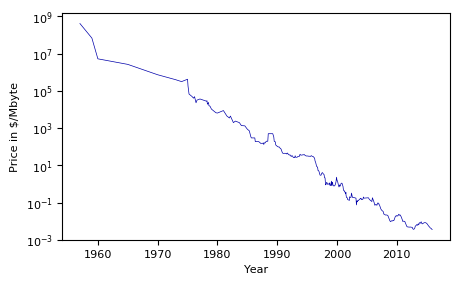

In [3]:
ram_prices = pd.read_csv('data/ram_price.csv')

plt.semilogy(ram_prices.date, ram_prices.price)
plt.xlabel("Year")
plt.ylabel("Price in $/Mbyte");

## A mini-data mining challenge (2 points (+1))

The goal here is to use everything you have learned to build the best model for a given classification task. The task is hosted on OpenML, so you will receive the train-test splits, and your model will be evaluated on the server. The goal is to reasonably select algorithms and hyperparameter settings to obtain the best model. You can also do model selection and parameter optimization as you have done before. Skeleton code is provided in the OpenML tutorial.

- All details can be found online:
    - The OpenML Task ID is 145676: http://www.openml.org/t/145676
    - The dataset description can be found here: http://www.openml.org/d/4537
- A leaderboard is kept of the best models: http://www.openml.org/t/145676#!people
    - You are able to see the solutions of others (by clicking in the timeline or run list), but resubmission of the exact same solution does not register on the leaderboard.
    - You can share one account (one API key) per team. In case you use two, we take the one that performs best.
- You can document the different experiments that you ran in this notebook. For each experiment, provide a description of how you chose the algorithms and parameters that you submitted. Try to reason about which experiments to try, don't just do an immense random search.
- Points are rewarded as follows:
    - 1 point for the breadth of experiments you ran (algorithms, hyperparameter settings)
    - 1 point for reasoning/insight and interpretation of the results
    - 1 (bonus) point for every team who has uploaded the best solution thus far **on AUC** (who reaches the top of the leaderboard at any moment during the assignment)
        - Note: On the leaderboard page, the 'frontier' line is drawn, and your top ranking is also shown in the table.
        
Note: Report AUC scores in your report as well. In case of issues with OpenML we will use the experiments and scores mentioned your report.

In [4]:
task = tasks.get_task(145677)

def test(est, grid, n_iter=10):
    X, y = shuffle(task.get_X_and_y())
    gs = RandomizedSearchCV(est, param_distributions=grid,
                            cv=5, n_jobs=-1, scoring='roc_auc',
                            n_iter=n_iter, verbose=3);
    gs.fit(X, y);
    clear_output()
    
    return gs.best_score_, gs.best_params_

In [5]:
best_nopre = test(LogisticRegression(), {
    'C':  [2**x for x in range(-24, 24)],
})

best = test(Pipeline([
    ('svd', TruncatedSVD()),
    ('pf', PolynomialFeatures(degree=2)),
    ('lr', LogisticRegression()),
]), {
    'svd__n_components': [10, 50, 100],
    'lr__C':  [2**x for x in range(-24, 24)],
})

print('lr without preprocessing '
      'best score: {:.3f} obtained with params: {}'.format(*best_nopre))
print('lr best score: {:.3f} obtained with params {}'.format(*best))

lr without preprocessing best score: 0.792 obtained with params: {'C': 0.0009765625}
lr best score: 0.834 obtained with params {'svd__n_components': 100, 'lr__C': 0.0625}


In [ ]:
best = test(RandomForestClassifier(), {
    'n_estimators': [2**x for x in range(4, 8)],
    'max_features': np.arange(0.05, 1.0, 0.05),
    'min_samples_split': [2**x for x in range(1, 5)],
    'min_samples_leaf': [2**x for x in range(0, 5)],
})
print('rf best score: {:.3f} obtained with params {}'.format(*best))

Fitting 5 folds for each of 10 candidates, totalling 50 fits


In [3]:
best_nopre = test(KNeighborsClassifier(), {
    'n_neighbors': [1, 3, 5, 7, 10, 25],
}, n_iter=6)

best = test(Pipeline([
    ('svd', TruncatedSVD()),
    ('pf', PolynomialFeatures(degree=2)),
    ('knn', KNeighborsClassifier()),
]), {
    'svd__n_components': [10, 50, 100],
    'knn__n_neighbors': [1, 3, 5, 7, 10, 25],
})

print('knn without preprocessing '
      'best score: {:.3f} obtained with params: {}'.format(*best_nopre))
print('knn best score: {:.3f} obtained with params {}'.format(*best))

knn without preprocessing
best score: 0.809 obtained with params: {'n_neighbors': 7}
knn best score: 0.808 obtained with params {'svd__n_components': 50, 'knn__n_neighbors': 5}


In [ ]:
best = test(Pipeline([
    ('svd', TruncatedSVD()),
    ('pf', PolynomialFeatures(degree=2)),
    ('svc', SVC()),
]), {
    'svd__n_components': [10, 50, 100],
    'svc__kernel': ['poly', 'rbf'],
    'svc__C': [2**x for x in range(-24, 24)],
    'svc__gamma': [2**x for x in range(-16, 16)],
    'svc__degree': range(2, 10),
})
print('svc best score: {:.3f} obtained with params {}'.format(*best))

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  4.1min


In [ ]:
pip.set_params(**gs.best_params_)
run = runs.run_task(task, pip)
run.publish()
print("Uploaded run with id %s. Check it at www.openml.org/r/%s" %(run.run_id,run.run_id))